# Diseased & Healthy Plant Detection in PlantVillage




#### **PlantVillage Dataset Overview**

**Context:**  
The **PlantVillage dataset** is a public dataset consisting of approximately **54,305 images** of both diseased and healthy plant leaves, collected under controlled conditions. It is designed to help researchers and developers build AI models capable of identifying plant diseases from leaf images.

**Content:**  
- The dataset includes images of **14 different crop species**, such as apple, blueberry, cherry, grape, orange, peach, pepper, potato, raspberry, soy, squash, strawberry, and tomato.
- The images contain **17 common plant diseases**, including:
  - **4 bacterial diseases**
  - **2 diseases caused by mold (Oomycete)**
  - **2 viral diseases**
  - **1 disease caused by a mite**
- In addition to diseased plant leaves, the dataset also contains images of **healthy leaves** from **12 crop species**, which are unaffected by any disease.

**Class Distribution:**  
The dataset is organized into **38 classes**, with each class representing either a specific crop species affected by a particular disease or the healthy version of the crop species.  
For example:  
- `Tomato___Early_blight`
- `Tomato___Healthy`
- `Apple___Scab`
- `Pepper,_bell___Healthy`

These images provide a comprehensive dataset to train AI models for accurate plant disease classification.


#Import Library

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization,GlobalAveragePooling2D
from tensorflow.keras.applications import VGG16, ResNet50, InceptionV3, MobileNetV2, EfficientNetB0
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
from tensorflow.keras.optimizers import Adam

2025-05-07 22:19:30.496408: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746656370.749193      31 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746656370.801877      31 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


#Read data

In [ ]:
# Define data paths
TRAIN_DIR = "/kaggle/input/plantvillage/PlantVillage/train"
VAL_DIR = "/kaggle/input/plantvillage/PlantVillage/val"
VAL_COPY_DIR = "/kaggle/working/val_copy"
TEST_DIR = "/kaggle/working/test"  # المجلد الجديد المؤقت لـ test

# Copy Validation Data to a New Directory

In [ ]:
import os
import shutil

# Create the new validation directory if it doesn't exist
os.makedirs(VAL_COPY_DIR, exist_ok=True)

# Loop over each class folder in the original validation directory
for class_name in os.listdir(VAL_DIR):
    class_path = os.path.join(VAL_DIR, class_name)
    if os.path.isdir(class_path):
        # Create corresponding class folder in the new validation directory
        new_class_path = os.path.join(VAL_COPY_DIR, class_name)
        os.makedirs(new_class_path, exist_ok=True)

        # Copy all images from the old class folder to the new class folder
        for img_name in os.listdir(class_path):
            src = os.path.join(class_path, img_name)
            dst = os.path.join(new_class_path, img_name)
            shutil.copy2(src, dst)

print("Validation data has been copied to:", VAL_COPY_DIR)


Validation data has been copied to: /kaggle/working/val_copy


# Create Test Directory and Split Validation Data

In [ ]:
import os
import shutil
from sklearn.model_selection import train_test_split




# إنشاء مجلد test الجديد
os.makedirs(TEST_DIR, exist_ok=True)

# لكل فئة داخل مجلد val
for class_name in os.listdir(VAL_COPY_DIR):
    class_path = os.path.join(VAL_COPY_DIR, class_name)
    if os.path.isdir(class_path):
        images = os.listdir(class_path)
        train_imgs, test_imgs = train_test_split(images, test_size=0.2, random_state=42)

        # إنشاء مجلد الفئة داخل مجلد test
        test_class_dir = os.path.join(TEST_DIR, class_name)
        os.makedirs(test_class_dir, exist_ok=True)

        # نقل الصور إلى مجلد test
        for img_name in test_imgs:
            src = os.path.join(class_path, img_name)
            dst = os.path.join(test_class_dir, img_name)
            shutil.move(src, dst)



# Count Images in Validation and Test Directories

In [ ]:
import os

# Count number of images in the validation (val_copy) folder
val_image_count = 0
for class_name in os.listdir(VAL_COPY_DIR):
    class_path = os.path.join(VAL_COPY_DIR, class_name)
    if os.path.isdir(class_path):
        val_image_count += len(os.listdir(class_path))

# Count number of images in the test folder
test_image_count = 0
for class_name in os.listdir(TEST_DIR):
    class_path = os.path.join(TEST_DIR, class_name)
    if os.path.isdir(class_path):
        test_image_count += len(os.listdir(class_path))

print(f"Number of images in Validation (val_copy): {val_image_count}")
print(f"Number of images in Test: {test_image_count}")


Number of images in Validation (val_copy): 8676
Number of images in Test: 2185


# Display Random Image Previews from Directory

In [ ]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def preview_images_from_directory(directory, num_images=5, title="Preview"):

    categories = os.listdir(directory)
    all_images = []

    for cat in categories:
        cat_path = os.path.join(directory, cat)
        if os.path.isdir(cat_path):
            images = [os.path.join(cat_path, img) for img in os.listdir(cat_path) if img.lower().endswith(('jpg', 'jpeg', 'png'))]
            all_images.extend([(img_path, cat) for img_path in images])


    selected_images = random.sample(all_images, min(num_images, len(all_images)))


    plt.figure(figsize=(15, 3))
    plt.suptitle(title, fontsize=16)

    for i, (img_path, label) in enumerate(selected_images):
        img = mpimg.imread(img_path)
        plt.subplot(1, num_images, i+1)
        plt.imshow(img)
        plt.title(label)
        plt.axis('off')

    plt.tight_layout()
    plt.show()


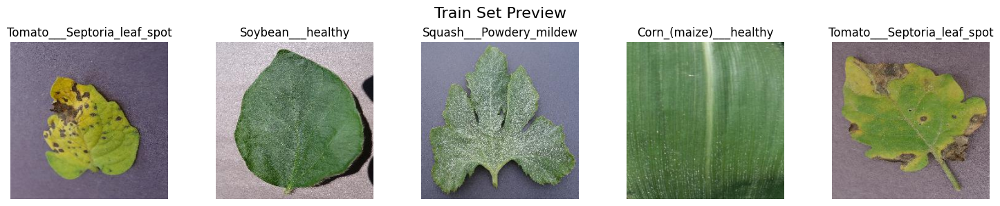

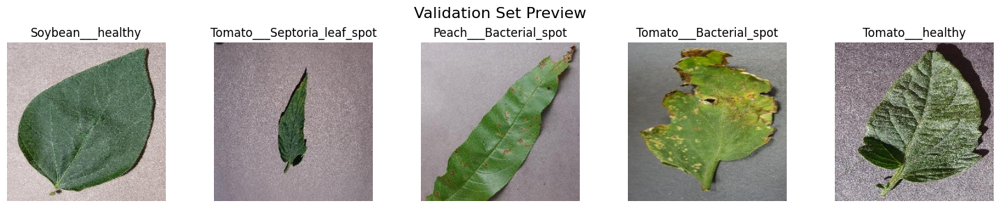

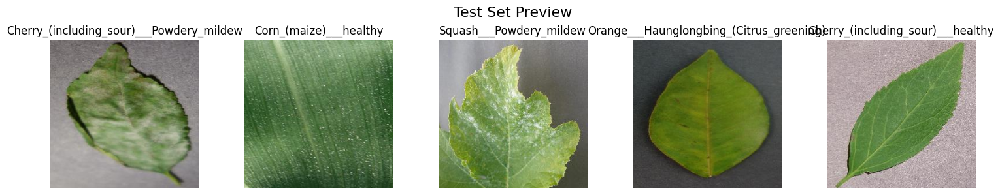

In [ ]:
preview_images_from_directory(TRAIN_DIR, title="Train Set Preview")
preview_images_from_directory(VAL_COPY_DIR, title="Validation Set Preview")
preview_images_from_directory(TEST_DIR, title="Test Set Preview")


#Data Augmentation

In [ ]:
# Image parameters
IMG_HEIGHT, IMG_WIDTH = 224, 224
BATCH_SIZE = 32

# Data Generators
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.3,
    horizontal_flip=True,
    brightness_range=[0.7, 1.3],
    channel_shift_range=20.0,
    fill_mode='nearest'
)

val_datagen = ImageDataGenerator(rescale=1./255)

# Train Generator
train_generator = train_datagen.flow_from_directory(
    TRAIN_DIR,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True
)

# Validation Generator
val_generator = val_datagen.flow_from_directory(
    VAL_COPY_DIR,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

# Test Generator
test_generator = val_datagen.flow_from_directory(
    TEST_DIR,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)


Found 43444 images belonging to 38 classes.
Found 8676 images belonging to 38 classes.
Found 2185 images belonging to 38 classes.


# Display Sample Images from Training and Validation Generators

Train Generator Class Indices: {'Apple___Apple_scab': 0, 'Apple___Black_rot': 1, 'Apple___Cedar_apple_rust': 2, 'Apple___healthy': 3, 'Blueberry___healthy': 4, 'Cherry_(including_sour)___Powdery_mildew': 5, 'Cherry_(including_sour)___healthy': 6, 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot': 7, 'Corn_(maize)___Common_rust_': 8, 'Corn_(maize)___Northern_Leaf_Blight': 9, 'Corn_(maize)___healthy': 10, 'Grape___Black_rot': 11, 'Grape___Esca_(Black_Measles)': 12, 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)': 13, 'Grape___healthy': 14, 'Orange___Haunglongbing_(Citrus_greening)': 15, 'Peach___Bacterial_spot': 16, 'Peach___healthy': 17, 'Pepper,_bell___Bacterial_spot': 18, 'Pepper,_bell___healthy': 19, 'Potato___Early_blight': 20, 'Potato___Late_blight': 21, 'Potato___healthy': 22, 'Raspberry___healthy': 23, 'Soybean___healthy': 24, 'Squash___Powdery_mildew': 25, 'Strawberry___Leaf_scorch': 26, 'Strawberry___healthy': 27, 'Tomato___Bacterial_spot': 28, 'Tomato___Early_blight': 29, 'Tom

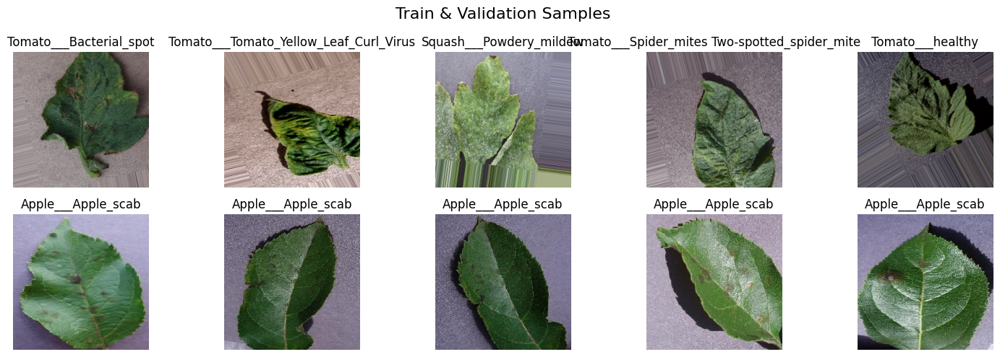

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

print("Train Generator Class Indices:", train_generator.class_indices)
print("Validation Generator Class Indices:", val_generator.class_indices)

# train_generator
train_images, train_labels = next(train_generator)
train_class_names = list(train_generator.class_indices.keys())

# val_generator
val_images, val_labels = next(val_generator)
val_class_names = list(val_generator.class_indices.keys())

plt.figure(figsize=(15, 5))

#train_generator
for i in range(5):
    plt.subplot(2, 5, i+1)
    plt.imshow(train_images[i])
    plt.title(train_class_names[np.argmax(train_labels[i])])
    plt.axis('off')

# val_generator
for i in range(5):
    plt.subplot(2, 5, i+6)
    plt.imshow(val_images[i])
    plt.title(val_class_names[np.argmax(val_labels[i])])
    plt.axis('off')

plt.suptitle("Train & Validation Samples", fontsize=16)
plt.tight_layout()
plt.show()

# Evaluate and Visualize Model Performance

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def evaluate_and_visualize_model(model, test_generator, history=None, model_name="Model"):
    """
    Evaluates the model, plots training history, shows confusion matrix, and prints classification report.

    Args:
        model: Trained Keras model.
        test_generator: Test data generator.
        history: Training history object (from model.fit), optional.
        model_name (str): Name of the model for titles and labeling.
    """
    loss, accuracy = model.evaluate(test_generator, verbose=0)
    print(f"\n{model_name} Evaluation:")
    print(f"Loss: {loss:.4f}")
    print(f"Accuracy: {accuracy:.4f}")

    y_pred = model.predict(test_generator)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true = test_generator.classes
    class_names = list(test_generator.class_indices.keys())


    print(f"\n{model_name} Classification Report:")
    print(classification_report(y_true, y_pred_classes, target_names=class_names))


    cm = confusion_matrix(y_true, y_pred_classes)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.title(f'{model_name} - Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()


    if history is not None:
        plt.figure(figsize=(12, 5))

        # Loss
        plt.subplot(1, 2, 1)
        plt.plot(history.history['loss'], label='Train Loss', marker='o', color='blue')
        plt.plot(history.history['val_loss'], label='Val Loss', marker='o', color='orange')
        plt.title(f'{model_name} - Loss Over Epochs')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()

        # Accuracy
        plt.subplot(1, 2, 2)
        plt.plot(history.history['accuracy'], label='Train Accuracy', marker='o', color='red')
        plt.plot(history.history['val_accuracy'], label='Val Accuracy', marker='o', color='green')
        plt.title(f'{model_name} - Accuracy Over Epochs')
        plt.xlabel('Epoch')
        plt.ylabel('Accuracy')
        plt.legend()

        plt.tight_layout()
        plt.show()


# Visualize Model Predictions on Test Images

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import random

def test_model_prediction_with_visuals(model, test_generator, class_names, num_images=9):

    test_generator.reset()
    images, labels = next(test_generator)


    preds = model.predict(images)
    pred_classes = np.argmax(preds, axis=1)
    true_classes = np.argmax(labels, axis=1)

    plt.figure(figsize=(12, 12))
    for i in range(num_images):
        idx = random.randint(0, len(images) - 1)
        plt.subplot(int(np.sqrt(num_images)), int(np.sqrt(num_images)), i + 1)
        plt.imshow(images[idx])
        plt.axis('off')
        plt.title(f"Actual: {class_names[true_classes[idx]]}\nPred: {class_names[pred_classes[idx]]}",
                  color='green' if true_classes[idx] == pred_classes[idx] else 'red')

    plt.tight_layout()
    plt.show()


#Callbacks to Prevent Overfitting and Improve Performance

In [ ]:
class_names = list(train_generator.class_indices.keys())

In [ ]:

early_stop = EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True)
checkpoint = ModelCheckpoint('best_model.keras', monitor='val_accuracy', save_best_only=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6)


# CNN


### A basic convolutional neural network built from scratch. It learns features directly from images but may not perform as well as pre-trained models unless trained on large datasets.


In [ ]:
model_cnn = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),

    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(len(os.listdir(TRAIN_DIR)), activation='softmax')
])

model_cnn.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Training the model
history_cnn = model_cnn.fit(train_generator, validation_data=val_generator, epochs=50,
                            callbacks=[early_stop, checkpoint])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
I0000 00:00:1746541926.704886      31 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1746541935.084981     134 service.cc:148] XLA service 0x7f9b78003d60 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1746541935.085618     134 service.cc:156]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1746541935.395940     134 cuda_dnn.cc:529] Loaded cuDNN version 90300


   1/1358 ━━━━━━━━━━━━━━━━━━━━ 4:00:36 11s/step - accuracy: 0.0000e+00 - loss: 3.6749

I0000 00:00:1746541939.531117     134 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1358/1358 ━━━━━━━━━━━━━━━━━━━━ 756s 549ms/step - accuracy: 0.2733 - loss: 2.7850 - val_accuracy: 0.6262 - val_loss: 1.2296
Epoch 2/50
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 633s 464ms/step - accuracy: 0.5272 - loss: 1.6301 - val_accuracy: 0.7258 - val_loss: 0.8809
Epoch 3/50
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 617s 452ms/step - accuracy: 0.6170 - loss: 1.2657 - val_accuracy: 0.7674 - val_loss: 0.7460
Epoch 4/50
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 610s 447ms/step - accuracy: 0.6617 - loss: 1.1030 - val_accuracy: 0.8157 - val_loss: 0.6032
Epoch 5/50
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 618s 453ms/step - accuracy: 0.6944 - loss: 0.9848 - val_accuracy: 0.7982 - val_loss: 0.6268
Epoch 6/50
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 616s 451ms/step - accuracy: 0.7311 - loss: 0.8754 - val_accuracy: 0.8601 - val_loss: 0.4367
Epoch 7/50
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 612s 448ms/step - accuracy: 0.7433 - loss: 0.8228 - val_accuracy: 0.8717 - val_loss: 0.4137
Epoch 8/50
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 605s 444ms/step - accuracy: 0.7


CNN Evaluation:
Loss: 0.1630
Accuracy: 0.9561
69/69 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step

CNN Classification Report:
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.92      0.92      0.92        26
                                 Apple___Black_rot       0.92      0.96      0.94        25
                          Apple___Cedar_apple_rust       1.00      1.00      1.00        11
                                   Apple___healthy       0.97      0.91      0.94        66
                               Blueberry___healthy       1.00      0.97      0.98        60
          Cherry_(including_sour)___Powdery_mildew       1.00      0.98      0.99        42
                 Cherry_(including_sour)___healthy       0.97      0.97      0.97        34
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.89      0.76      0.82        21
                       Corn_(maize)___Common_rust_      

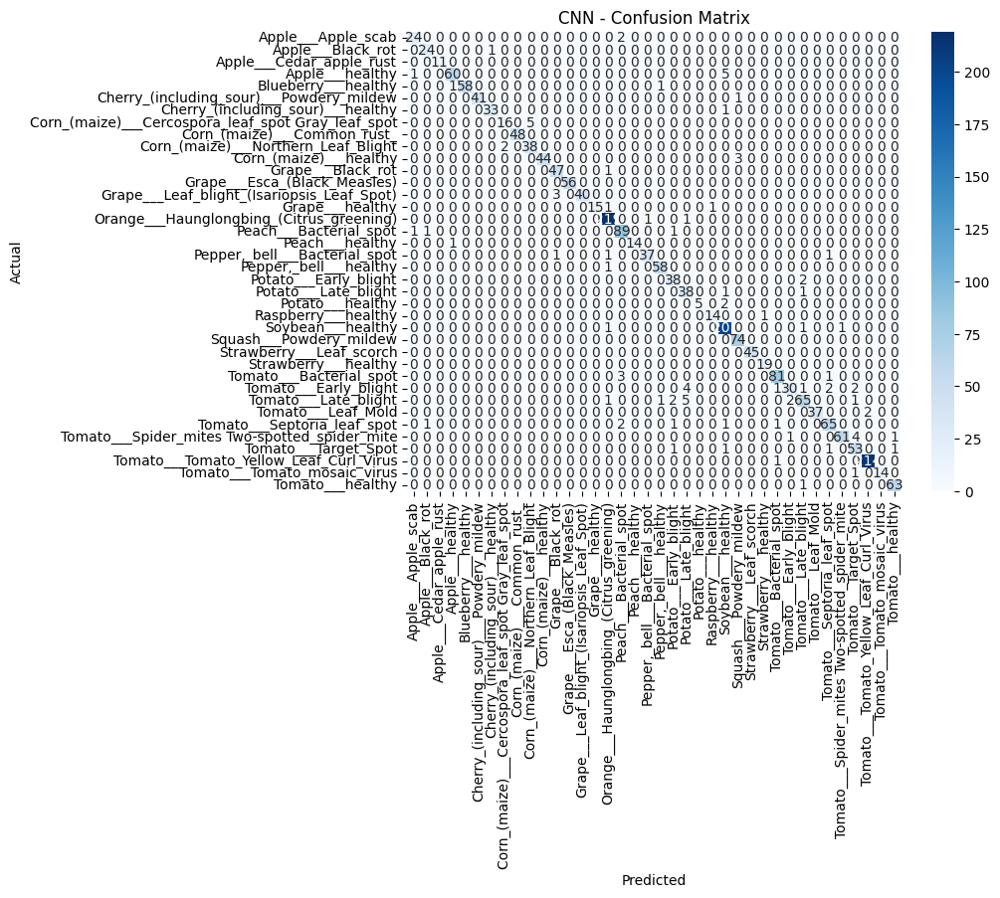

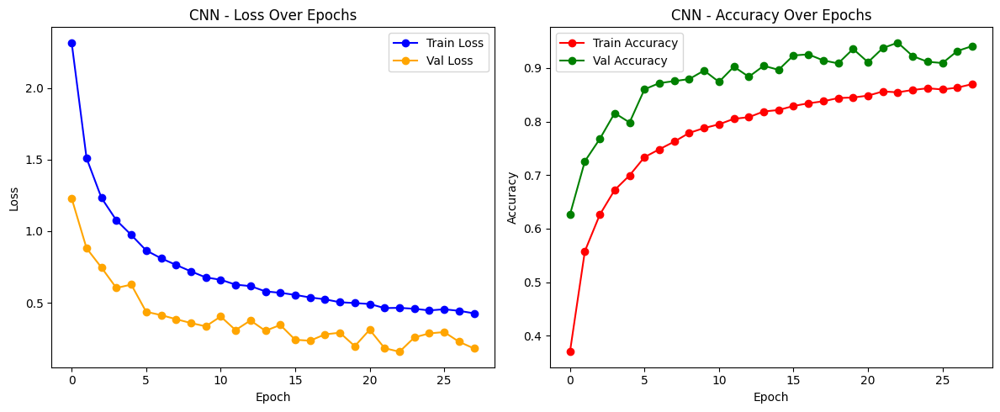

In [ ]:
evaluate_and_visualize_model(model_cnn, test_generator, history_cnn, model_name="CNN")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


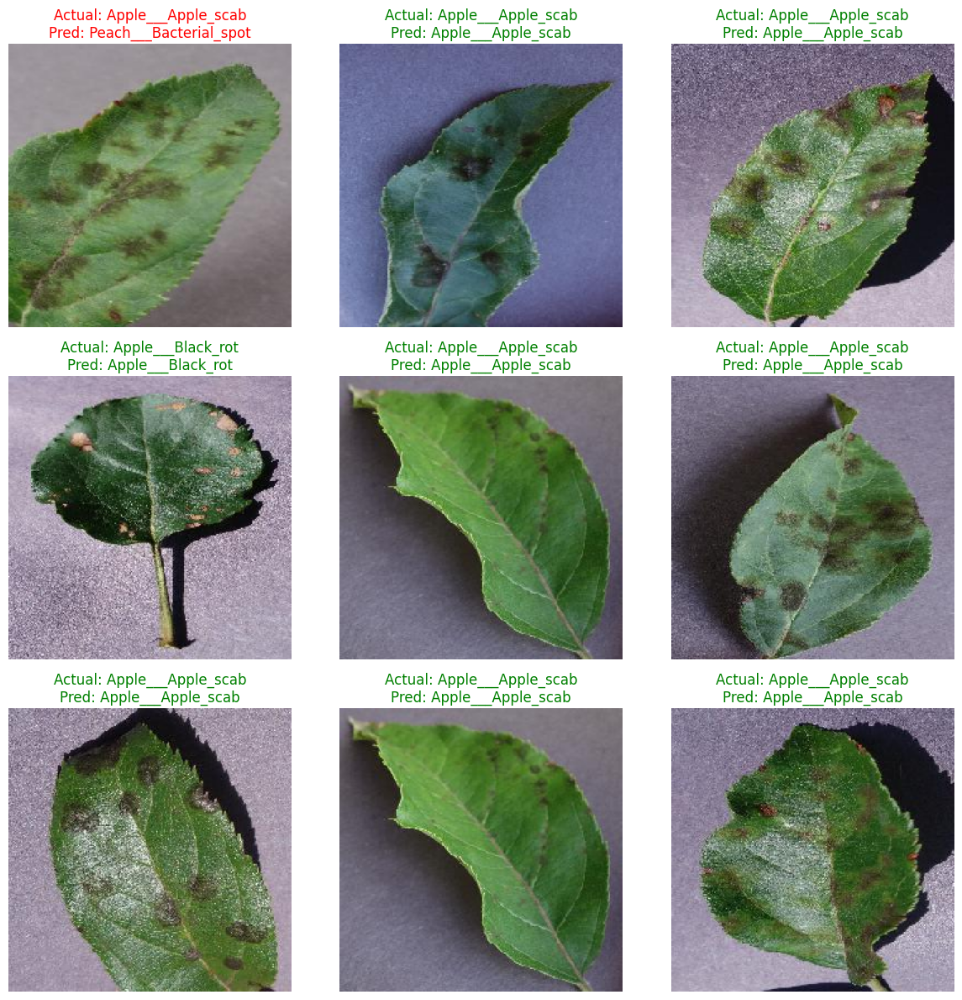

In [ ]:

test_model_prediction_with_visuals(model_cnn, test_generator, class_names)

In [ ]:
model.save("modelcnn.keras")

# VGG16


### A classic CNN known for its simplicity and effectiveness. It has many layers and works well on image tasks, though it’s slower and heavier than more modern architectures.



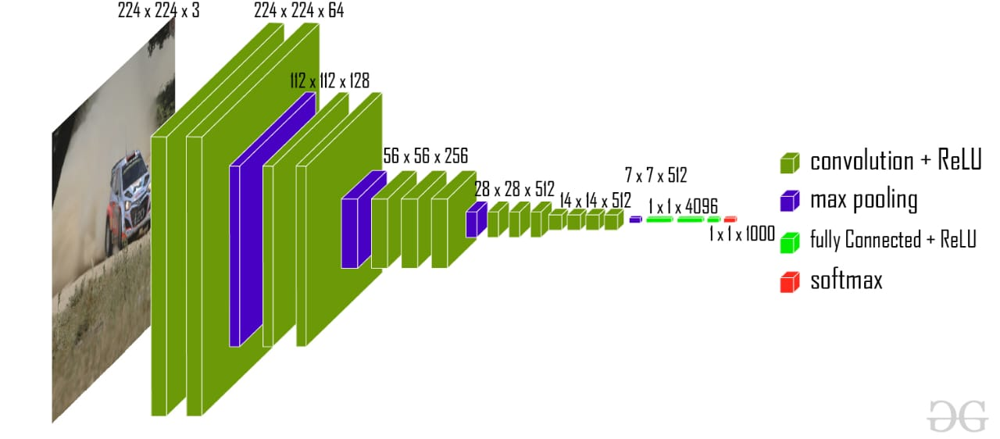

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten, Dense, Dropout
from tensorflow.keras.applications import VGG16
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

IMG_HEIGHT, IMG_WIDTH = 224, 224
BATCH_SIZE = 32

vgg16_base = VGG16(weights='imagenet', include_top=False, input_shape=(IMG_HEIGHT, IMG_WIDTH, 3))

vgg16_base.trainable = True
for layer in vgg16_base.layers[:-4]:
    layer.trainable = False

model_vgg16 = Sequential([
    vgg16_base,
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(len(os.listdir(TRAIN_DIR)), activation='softmax')
])


optimizer = Adam(learning_rate=0.0001)
model_vgg16.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Training the model
history_vgg16 = model_vgg16.fit(
    train_generator,
    validation_data=val_generator,
    epochs=50,
    callbacks=[early_stop, checkpoint]
)

Epoch 1/50
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 589s 428ms/step - accuracy: 0.5023 - loss: 1.9038 - val_accuracy: 0.8960 - val_loss: 0.3275
Epoch 2/50
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 581s 426ms/step - accuracy: 0.8375 - loss: 0.5676 - val_accuracy: 0.9374 - val_loss: 0.1896
Epoch 3/50
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 581s 426ms/step - accuracy: 0.8982 - loss: 0.3462 - val_accuracy: 0.9604 - val_loss: 0.1248
Epoch 4/50
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 574s 420ms/step - accuracy: 0.9182 - loss: 0.2762 - val_accuracy: 0.9618 - val_loss: 0.1150
Epoch 5/50
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 574s 421ms/step - accuracy: 0.9337 - loss: 0.2247 - val_accuracy: 0.9591 - val_loss: 0.1308
Epoch 6/50
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 569s 417ms/step - accuracy: 0.9416 - loss: 0.1966 - val_accuracy: 0.9675 - val_loss: 0.0963
Epoch 7/50
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 567s 415ms/step - accuracy: 0.9488 - loss: 0.1701 - val_accuracy: 0.9522 - val_loss: 0.1597
Epoch 8/50
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 567s 415ms/step - ac


VGG16 Evaluation:
Loss: 0.1153
Accuracy: 0.9689
69/69 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step

VGG16 Classification Report:
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       1.00      1.00      1.00        26
                                 Apple___Black_rot       1.00      1.00      1.00        25
                          Apple___Cedar_apple_rust       1.00      1.00      1.00        11
                                   Apple___healthy       1.00      1.00      1.00        66
                               Blueberry___healthy       1.00      1.00      1.00        60
          Cherry_(including_sour)___Powdery_mildew       1.00      1.00      1.00        42
                 Cherry_(including_sour)___healthy       1.00      0.97      0.99        34
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.86      0.86      0.86        21
                       Corn_(maize)___Common_rust_  

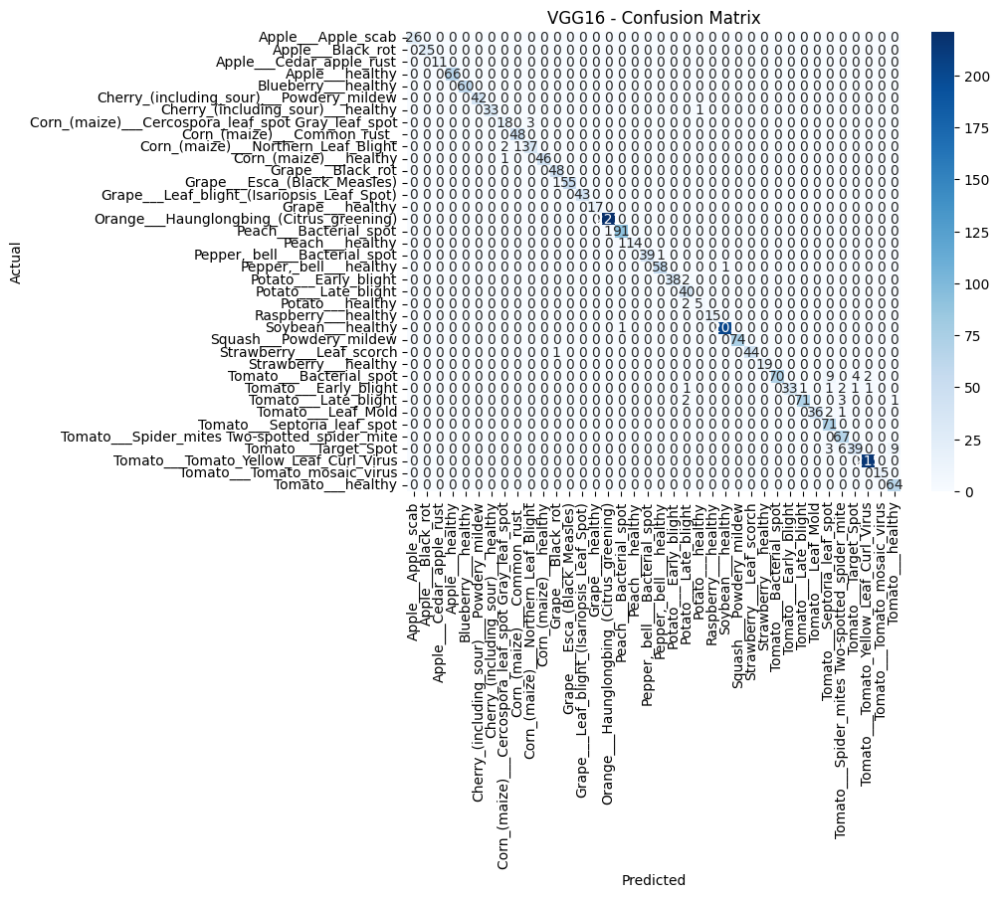

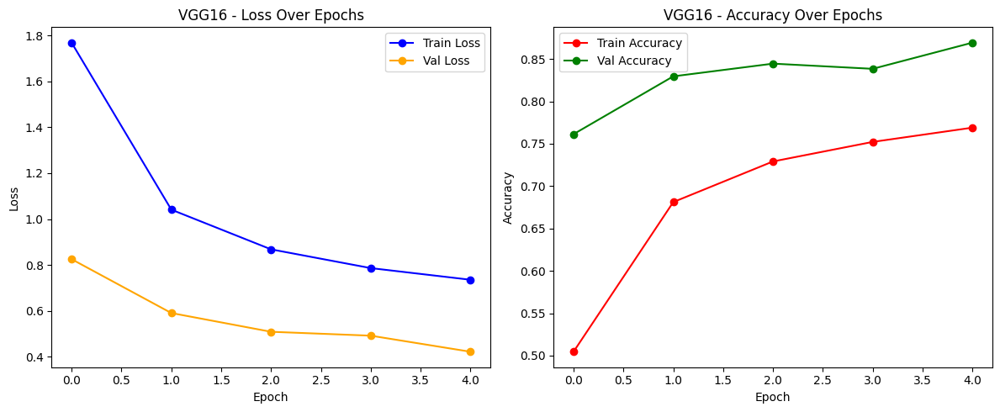

In [ ]:
evaluate_and_visualize_model(model_vgg16, test_generator, history_vgg16, model_name="VGG16")

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 528ms/step


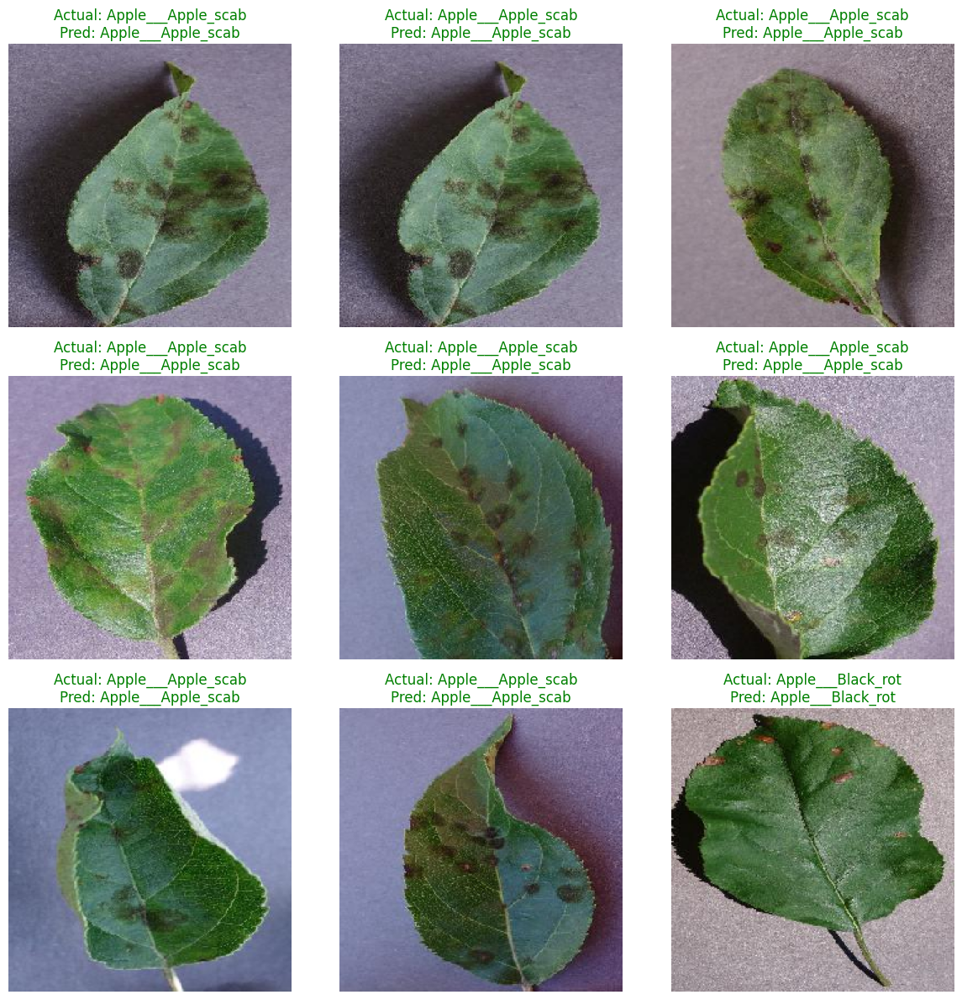

In [ ]:
test_model_prediction_with_visuals(model_vgg16, test_generator, class_names)

In [ ]:
model.save("modelvgg.keras")

# MobileNetV2

### A lightweight, fast, and efficient model designed for mobile and embedded devices. It balances performance and speed, making it great for real-time applications.


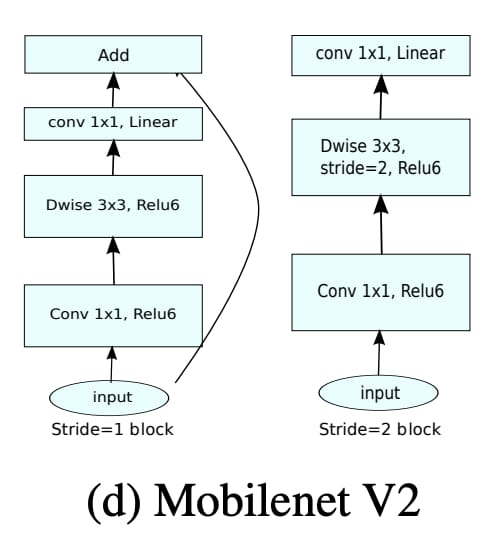

In [ ]:
# Transfer Learning - MobileNetV2
mobilenetv2_base = MobileNetV2(weights='imagenet', include_top=False, input_shape=(IMG_HEIGHT, IMG_WIDTH, 3))
mobilenetv2_base.trainable = False  # Freeze the layers

model_mobilenetv2 = Sequential([
    mobilenetv2_base,
    Flatten(),
    Dense(256, activation='relu'),
    BatchNormalization(),
    Dropout(0.5),
    Dense(len(os.listdir(TRAIN_DIR)), activation='softmax')  # عدد الفئات حسب مجلدات TRAIN_DIR
])

model_mobilenetv2.compile(optimizer=Adam(learning_rate=1e-5),
                          loss='categorical_crossentropy',
                          metrics=['accuracy'])

# Training MobileNetV2 model
history_mobilenetv2 = model_mobilenetv2.fit(
    train_generator,
    validation_data=val_generator,
    epochs=20,
    callbacks=[early_stop, checkpoint]
)


I0000 00:00:1746617583.809699      31 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1746617599.663230     113 service.cc:148] XLA service 0x7b2058003f70 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1746617599.664032     113 service.cc:156]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1746617600.614667     113 cuda_dnn.cc:529] Loaded cuDNN version 90300


   1/1358 ━━━━━━━━━━━━━━━━━━━━ 6:29:43 17s/step - accuracy: 0.0000e+00 - loss: 5.3297

I0000 00:00:1746617604.814134     113 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1358/1358 ━━━━━━━━━━━━━━━━━━━━ 893s 646ms/step - accuracy: 0.4865 - loss: 2.1217 - val_accuracy: 0.8861 - val_loss: 0.4137
Epoch 2/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 616s 452ms/step - accuracy: 0.8019 - loss: 0.6871 - val_accuracy: 0.9191 - val_loss: 0.2909
Epoch 3/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 605s 443ms/step - accuracy: 0.8455 - loss: 0.5307 - val_accuracy: 0.9349 - val_loss: 0.2337
Epoch 4/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 603s 441ms/step - accuracy: 0.8709 - loss: 0.4432 - val_accuracy: 0.9361 - val_loss: 0.2167
Epoch 5/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 603s 442ms/step - accuracy: 0.8854 - loss: 0.3938 - val_accuracy: 0.9444 - val_loss: 0.1905
Epoch 6/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 602s 441ms/step - accuracy: 0.8895 - loss: 0.3667 - val_accuracy: 0.9450 - val_loss: 0.1871
Epoch 7/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 608s 446ms/step - accuracy: 0.8995 - loss: 0.3374 - val_accuracy: 0.9464 - val_loss: 0.1764
Epoch 8/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 604s 443ms/step - accuracy: 0.9


model_mobilenetv2 Evaluation:
Loss: 0.1216
Accuracy: 0.9606
69/69 ━━━━━━━━━━━━━━━━━━━━ 9s 82ms/step

model_mobilenetv2 Classification Report:
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.96      0.96      0.96        26
                                 Apple___Black_rot       1.00      1.00      1.00        25
                          Apple___Cedar_apple_rust       1.00      1.00      1.00        11
                                   Apple___healthy       0.95      0.95      0.95        66
                               Blueberry___healthy       1.00      1.00      1.00        60
          Cherry_(including_sour)___Powdery_mildew       1.00      0.98      0.99        42
                 Cherry_(including_sour)___healthy       1.00      1.00      1.00        34
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.86      0.86      0.86        21
                       Corn_

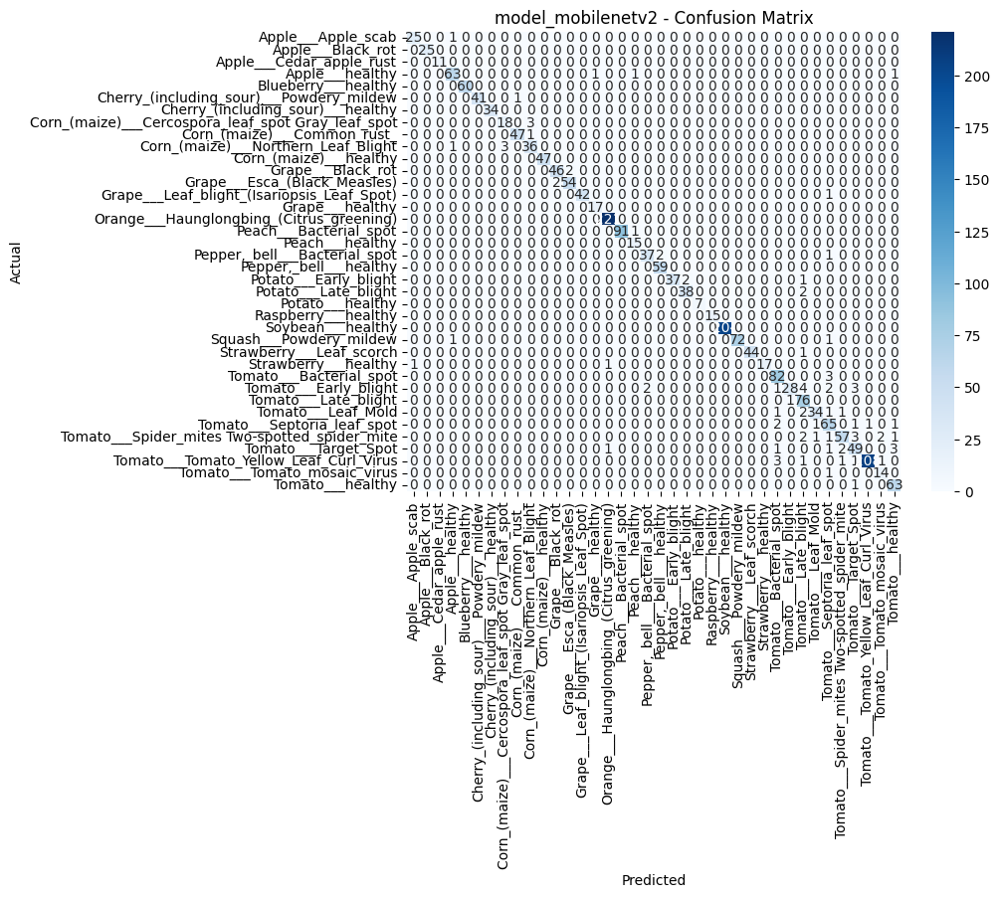

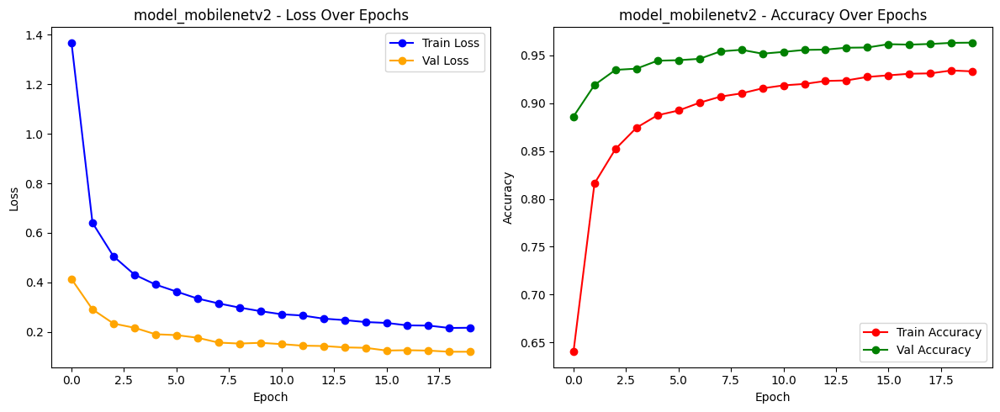

In [ ]:
evaluate_and_visualize_model(model_mobilenetv2, test_generator, history_mobilenetv2, model_name="model_mobilenetv2")

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


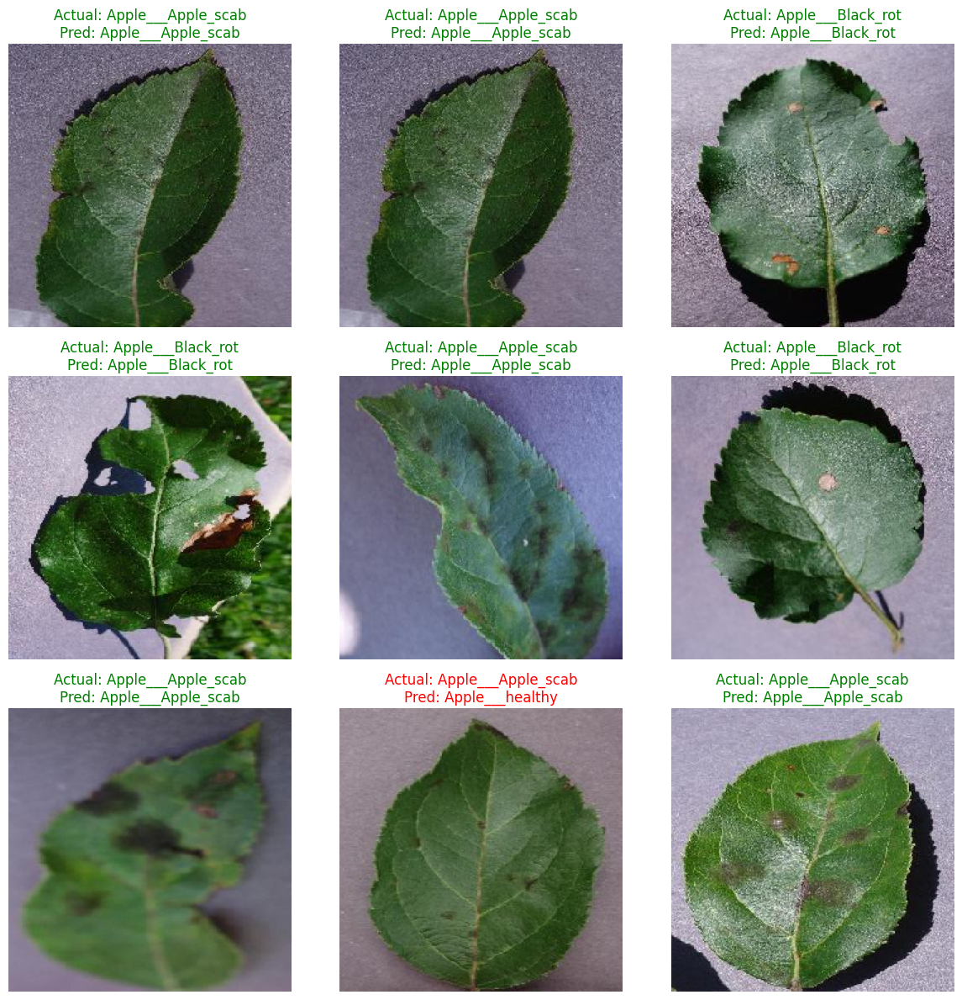

In [ ]:
test_model_prediction_with_visuals(model_mobilenetv2, test_generator, class_names)

In [ ]:
model.save("mobilenet.keras")

# Xception

### An advanced version of Inception that uses depthwise separable convolutions. It offers strong performance and accuracy, especially on complex image data.


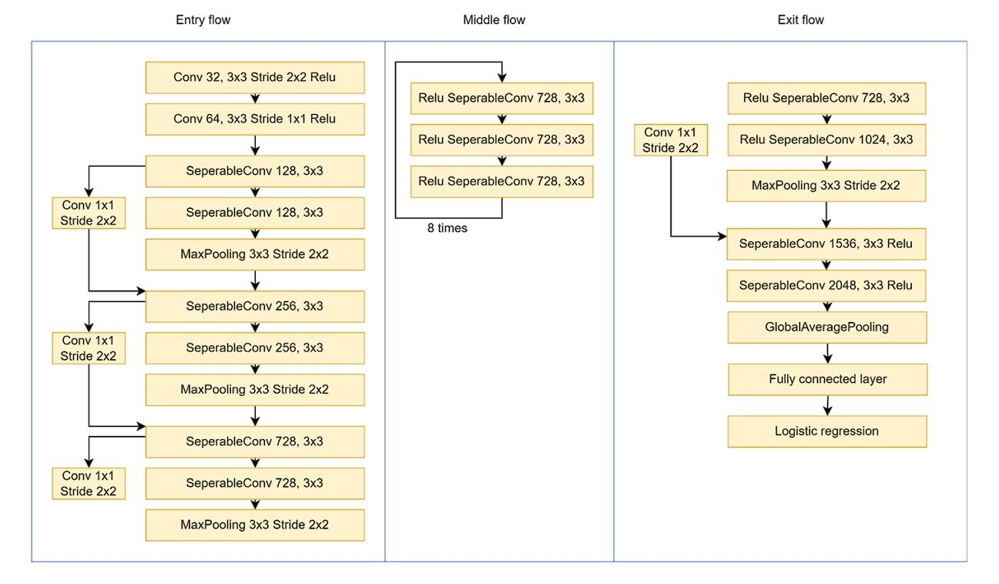

In [ ]:
from tensorflow.keras.applications import Xception

# Transfer Learning - Xception
xception_base = Xception(weights='imagenet', include_top=False, input_shape=(IMG_HEIGHT, IMG_WIDTH, 3))
xception_base.trainable = False  # Freeze the layers

model_xception = Sequential([
    xception_base,
    Flatten(),
    Dense(256, activation='relu'),
    BatchNormalization(),
    Dropout(0.5),
    Dense(len(os.listdir(TRAIN_DIR)), activation='softmax')
])

model_xception.compile(optimizer=Adam(learning_rate=1e-5),
                       loss='categorical_crossentropy',
                       metrics=['accuracy'])

# Training Xception model
history_xception = model_xception.fit(
    train_generator,
    validation_data=val_generator,
    epochs=20,
    callbacks=[early_stop, checkpoint]
)

83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 640s 460ms/step - accuracy: 0.5327 - loss: 1.8410 - val_accuracy: 0.8530 - val_loss: 0.5060
Epoch 2/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 614s 450ms/step - accuracy: 0.7886 - loss: 0.7314 - val_accuracy: 0.8934 - val_loss: 0.3617
Epoch 3/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 613s 449ms/step - accuracy: 0.8258 - loss: 0.5988 - val_accuracy: 0.9020 - val_loss: 0.3243
Epoch 4/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 616s 452ms/step - accuracy: 0.8456 - loss: 0.5217 - val_accuracy: 0.9026 - val_loss: 0.3112
Epoch 5/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 687s 503ms/step - accuracy: 0.8625 - loss: 0.4683 - val_accuracy: 0.9184 - val_loss: 0.2627



Xception Evaluation:
Loss: 0.5055
Accuracy: 0.8540
69/69 ━━━━━━━━━━━━━━━━━━━━ 11s 116ms/step

Xception Classification Report:
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.71      0.65      0.68        26
                                 Apple___Black_rot       0.86      0.72      0.78        25
                          Apple___Cedar_apple_rust       0.60      0.55      0.57        11
                                   Apple___healthy       0.73      0.88      0.80        66
                               Blueberry___healthy       0.83      0.95      0.88        60
          Cherry_(including_sour)___Powdery_mildew       0.95      0.95      0.95        42
                 Cherry_(including_sour)___healthy       0.91      0.94      0.93        34
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.89      0.76      0.82        21
                       Corn_(maize)___Common

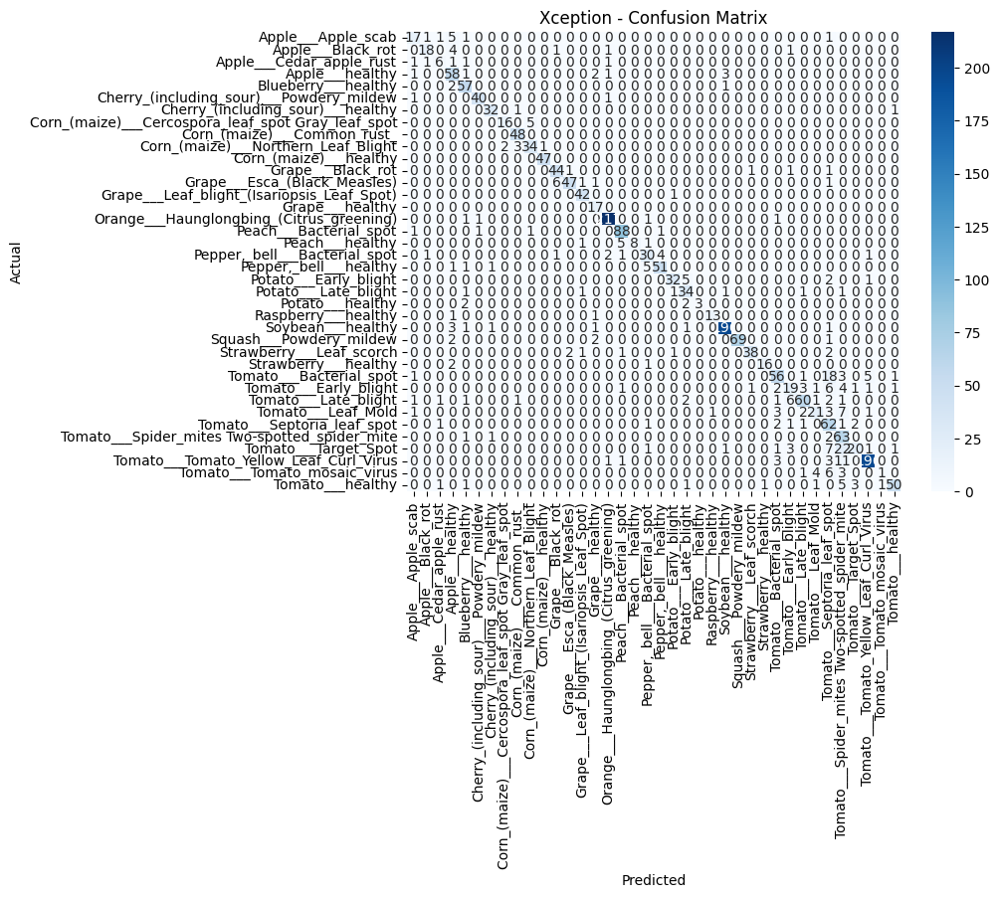

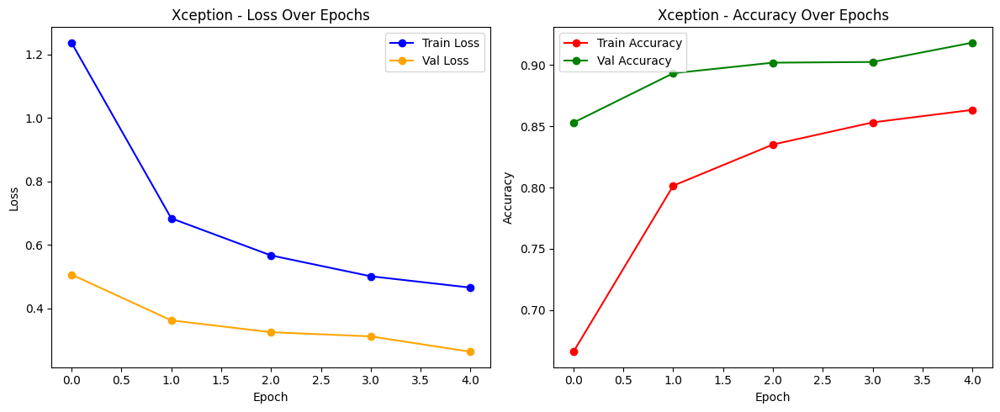

In [ ]:
evaluate_and_visualize_model(model_xception, test_generator, history_xception, model_name="Xception")

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


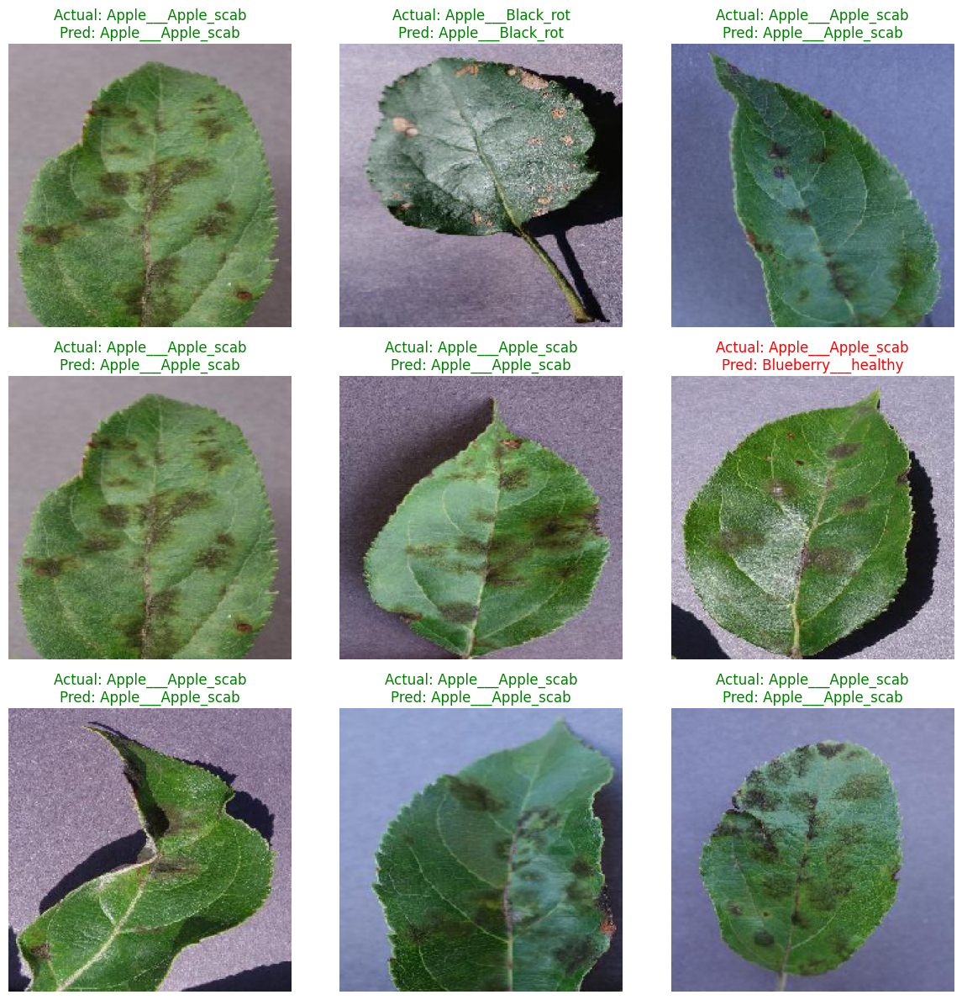

In [ ]:
test_model_prediction_with_visuals(model_xception, test_generator, class_names)

In [ ]:
model.save("xception.keras")

# DenseNet121


### A densely connected CNN where each layer is connected to every other layer. This helps with feature reuse and gradient flow, leading to better accuracy and less vanishing gradients.


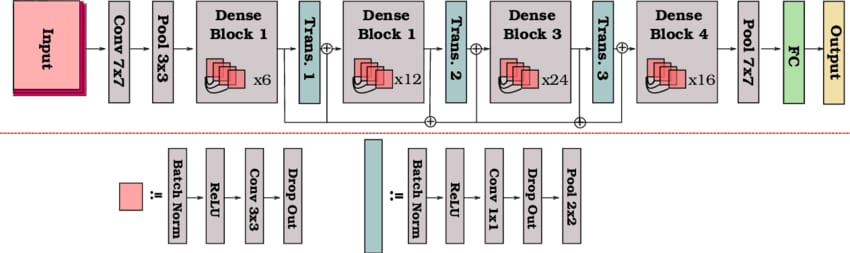

In [ ]:
from tensorflow.keras.applications import DenseNet121

# Transfer Learning - DenseNet121
densenet_base = DenseNet121(weights='imagenet', include_top=False, input_shape=(IMG_HEIGHT, IMG_WIDTH, 3))
densenet_base.trainable = False  # Freeze the layers

model_densenet = Sequential([
    densenet_base,
    Flatten(),
    Dense(256, activation='relu'),
    BatchNormalization(),
    Dropout(0.5),
    Dense(len(os.listdir(TRAIN_DIR)), activation='softmax')  # عدد الفئات حسب TRAIN_DIR
])

model_densenet.compile(optimizer=Adam(learning_rate=1e-5),
                       loss='categorical_crossentropy',
                       metrics=['accuracy'])

# Training DenseNet121 model
history_densenet = model_densenet.fit(
    train_generator,
    validation_data=val_generator,
    epochs=20,
    callbacks=[early_stop, checkpoint]
)


29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 768s 536ms/step - accuracy: 0.4387 - loss: 2.3381 - val_accuracy: 0.8626 - val_loss: 0.4734
Epoch 2/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 708s 519ms/step - accuracy: 0.7991 - loss: 0.7253 - val_accuracy: 0.9214 - val_loss: 0.2618
Epoch 3/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 704s 516ms/step - accuracy: 0.8488 - loss: 0.5276 - val_accuracy: 0.9418 - val_loss: 0.2011
Epoch 4/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 668s 489ms/step - accuracy: 0.8734 - loss: 0.4358 - val_accuracy: 0.9447 - val_loss: 0.1727
Epoch 5/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 717s 526ms/step - accuracy: 0.8896 - loss: 0.3820 - val_accuracy: 0.9531 - val_loss: 0.1497



DenseNet121 Evaluation:
Loss: 0.4842
Accuracy: 0.8595
69/69 ━━━━━━━━━━━━━━━━━━━━ 30s 260ms/step

DenseNet121 Classification Report:
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.87      0.50      0.63        26
                                 Apple___Black_rot       0.88      0.84      0.86        25
                          Apple___Cedar_apple_rust       1.00      0.36      0.53        11
                                   Apple___healthy       0.75      0.97      0.85        66
                               Blueberry___healthy       0.90      1.00      0.94        60
          Cherry_(including_sour)___Powdery_mildew       0.97      0.90      0.94        42
                 Cherry_(including_sour)___healthy       0.87      1.00      0.93        34
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       1.00      0.57      0.73        21
                       Corn_(maize)___

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


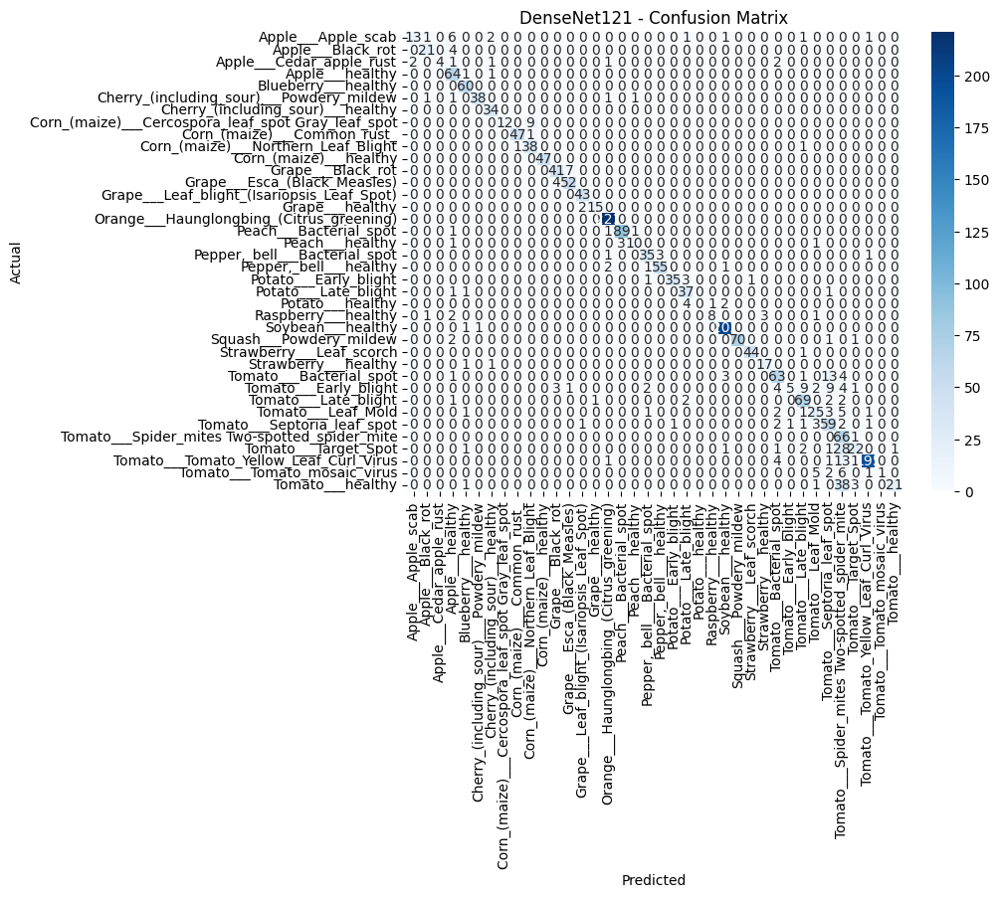

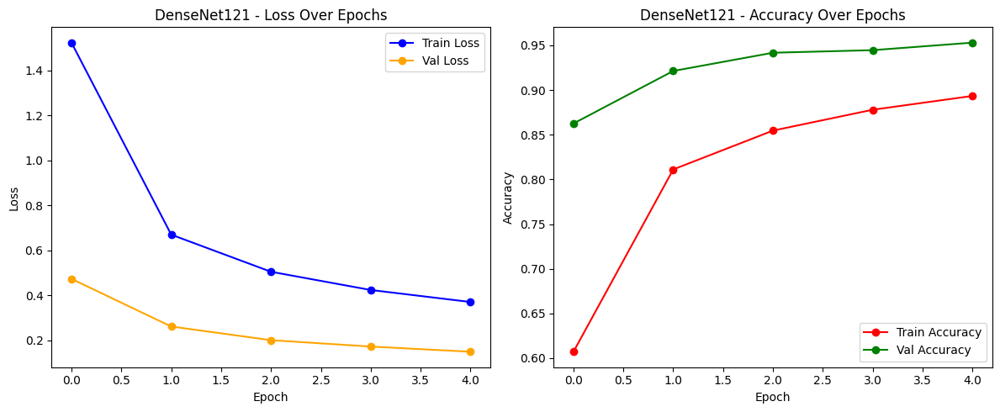

In [ ]:
evaluate_and_visualize_model(model_densenet, test_generator, history_densenet, model_name="DenseNet121")

1/1 ━━━━━━━━━━━━━━━━━━━━ 13s 13s/step


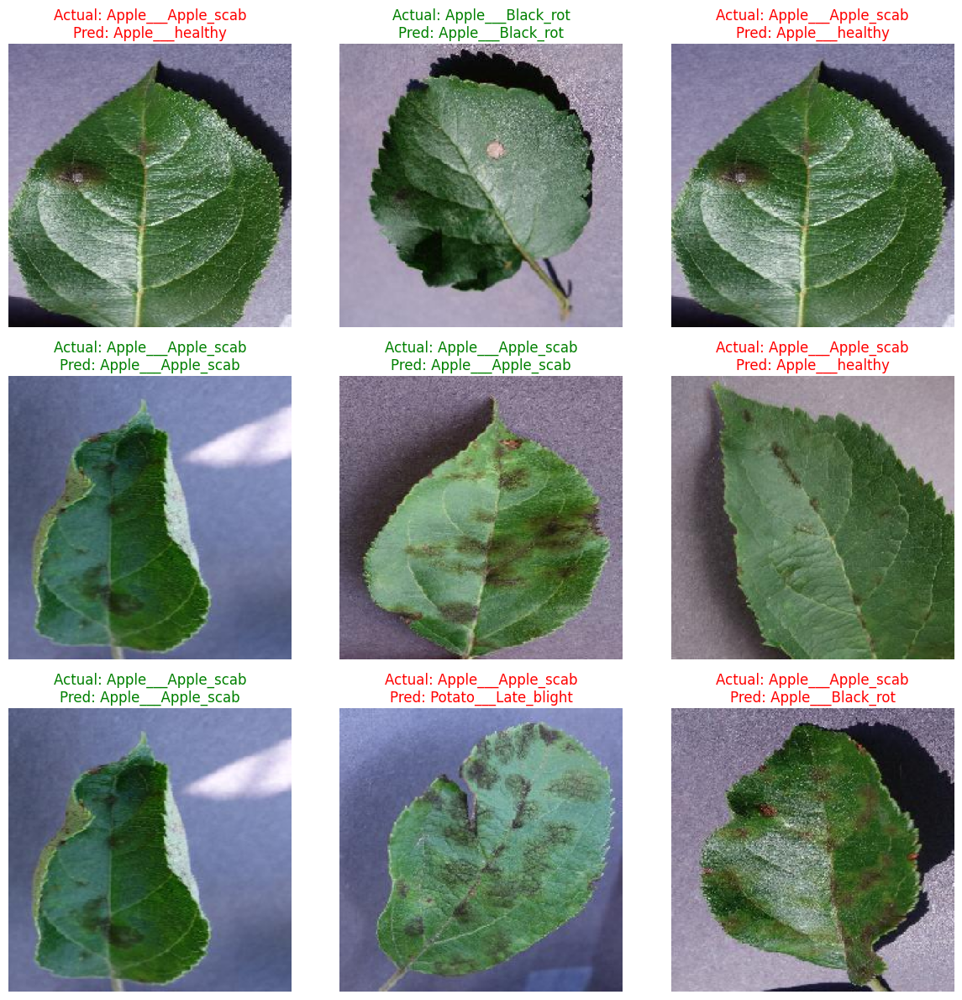

In [ ]:
test_model_prediction_with_visuals(model_densenet, test_generator, class_names)

In [ ]:
model.save("densenet.keras")

# InceptionV3


### A powerful CNN that uses "inception modules" to process data at multiple scales simultaneously. It gives high accuracy and is good at capturing fine details in images.


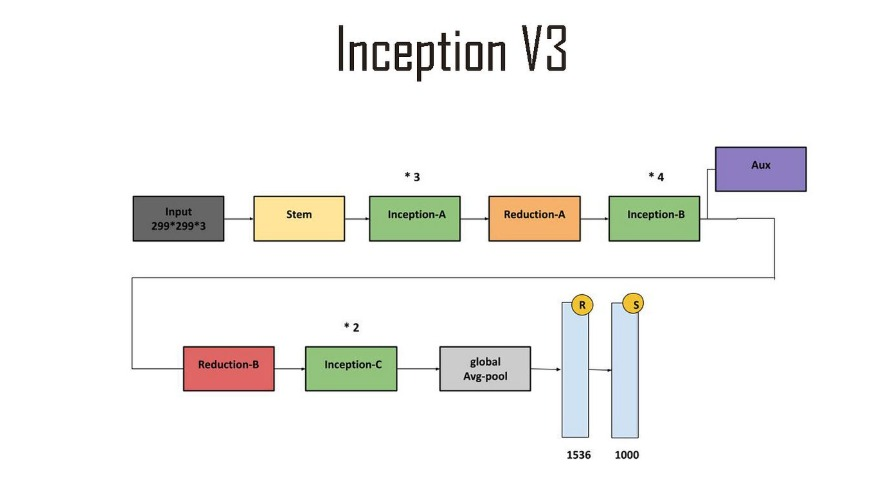

In [ ]:
# Transfer Learning - InceptionV3
inceptionv3_base = InceptionV3(weights='imagenet', include_top=False, input_shape=(IMG_HEIGHT, IMG_WIDTH, 3))
inceptionv3_base.trainable = False  # Freeze the layers


model_inceptionv3 = Sequential([
    inceptionv3_base,
    Flatten(),
    Dense(256, activation='relu'),
    BatchNormalization(),
    Dropout(0.5),
    Dense(len(os.listdir(TRAIN_DIR)), activation='softmax')
])
model_inceptionv3.compile(optimizer=Adam(learning_rate=1e-5),
                          loss='categorical_crossentropy',
                          metrics=['accuracy'])
# Training the model
history_inceptionv3 = model_inceptionv3.fit(train_generator, validation_data=val_generator, epochs=20,
                                            callbacks=[early_stop, checkpoint])

I0000 00:00:1746656599.109171      31 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1746656619.306103     111 service.cc:148] XLA service 0x7c2cf8003e40 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1746656619.307030     111 service.cc:156]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1746656621.177775     111 cuda_dnn.cc:529] Loaded cuDNN version 90300


   1/1358 ━━━━━━━━━━━━━━━━━━━━ 9:00:55 24s/step - accuracy: 0.0000e+00 - loss: 4.9322

I0000 00:00:1746656627.626493     111 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1358/1358 ━━━━━━━━━━━━━━━━━━━━ 784s 560ms/step - accuracy: 0.4311 - loss: 2.3352 - val_accuracy: 0.8128 - val_loss: 0.6619
Epoch 2/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 590s 432ms/step - accuracy: 0.7456 - loss: 0.9066 - val_accuracy: 0.8544 - val_loss: 0.5070
Epoch 3/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 581s 426ms/step - accuracy: 0.7964 - loss: 0.7110 - val_accuracy: 0.8776 - val_loss: 0.4201
Epoch 4/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 575s 422ms/step - accuracy: 0.8208 - loss: 0.6285 - val_accuracy: 0.8908 - val_loss: 0.3744
Epoch 5/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 574s 421ms/step - accuracy: 0.8381 - loss: 0.5611 - val_accuracy: 0.8942 - val_loss: 0.3525
Epoch 6/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 574s 421ms/step - accuracy: 0.8473 - loss: 0.5189 - val_accuracy: 0.9046 - val_loss: 0.3277
Epoch 7/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 576s 422ms/step - accuracy: 0.8546 - loss: 0.4940 - val_accuracy: 0.9076 - val_loss: 0.3173
Epoch 8/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 581s 426ms/step - accuracy: 0.8


InceptionV3 Evaluation:
Loss: 0.2193
Accuracy: 0.9309
69/69 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step

InceptionV3 Classification Report:
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       1.00      0.77      0.87        26
                                 Apple___Black_rot       1.00      0.96      0.98        25
                          Apple___Cedar_apple_rust       0.92      1.00      0.96        11
                                   Apple___healthy       0.93      0.97      0.95        66
                               Blueberry___healthy       0.98      1.00      0.99        60
          Cherry_(including_sour)___Powdery_mildew       1.00      0.98      0.99        42
                 Cherry_(including_sour)___healthy       0.94      1.00      0.97        34
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       1.00      0.67      0.80        21
                       Corn_(maize)___

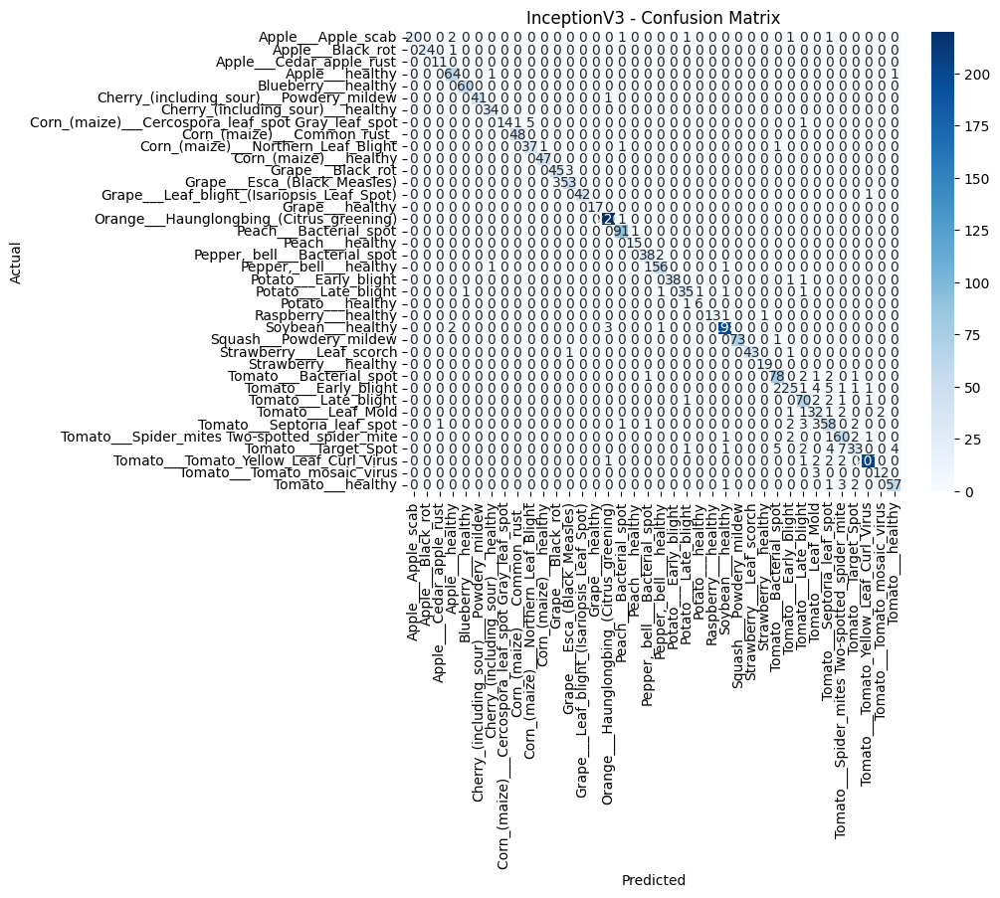

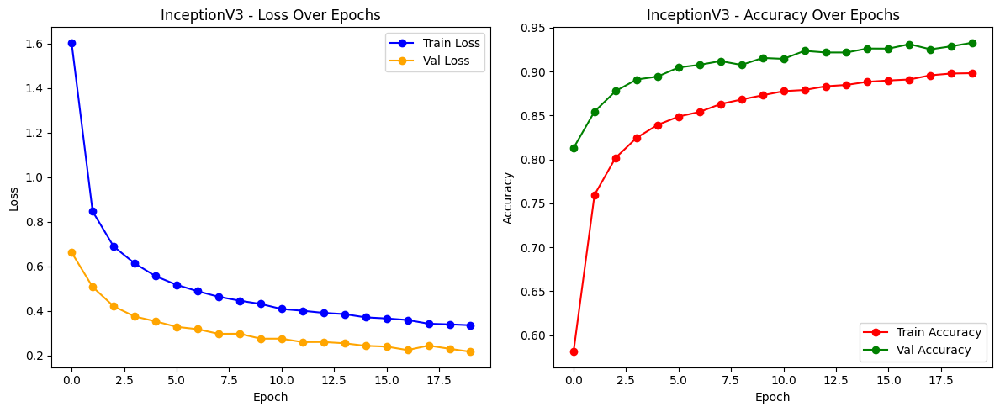

In [ ]:
evaluate_and_visualize_model(model_inceptionv3, test_generator, history_inceptionv3, model_name="InceptionV3")

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


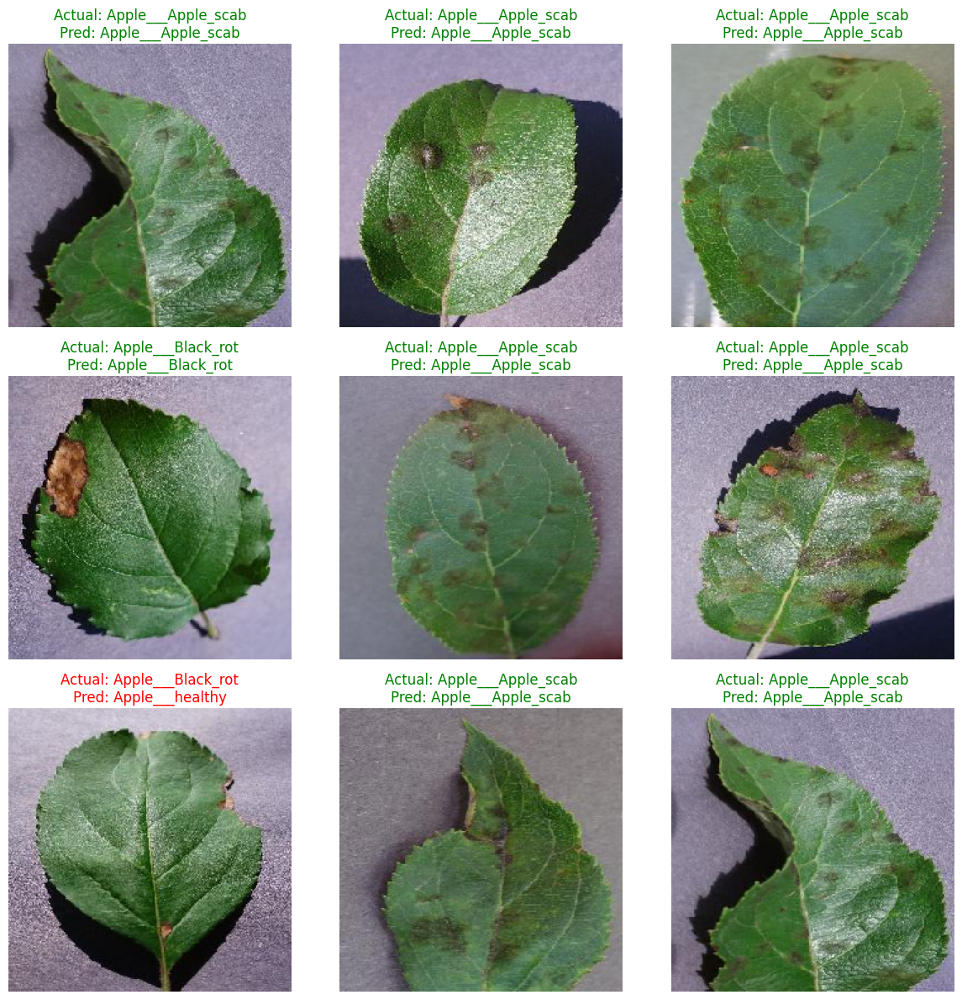

In [ ]:
test_model_prediction_with_visuals(model_inceptionv3, test_generator, class_names)

In [ ]:
model.save("inceptionv3.keras")

# Evaluate and Compare Model Performance


Summary of All Models:

             Accuracy  Precision  Recall
VGG16          0.9689       0.97    0.96
MobileNetV2    0.9606       0.96    0.95
CNN            0.9561       0.96    0.94
inceptionv3    0.9309       0.93    0.92
DenseNet121    0.8595       0.88    0.78
Xception       0.8500       0.87    0.80


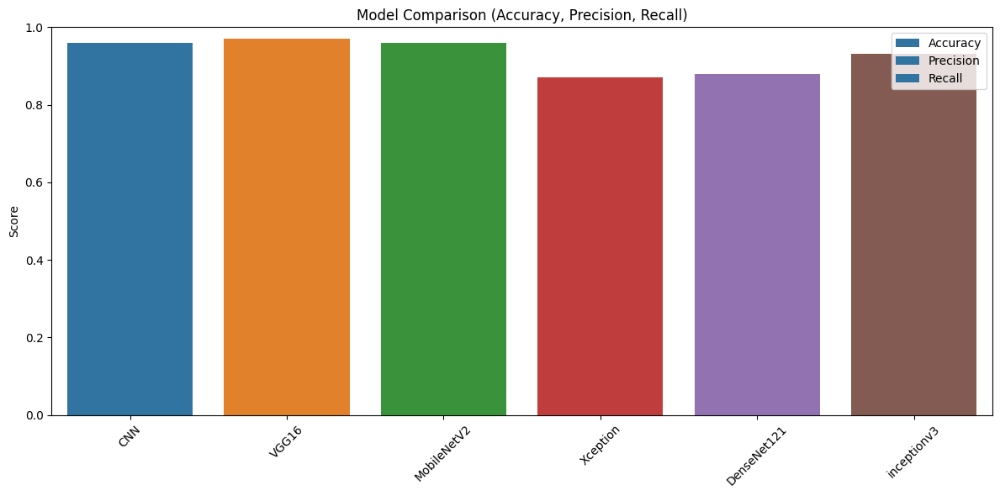

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd


models_info = {
    "MobileNetV2": model_mobilenetv2,
    "Xception": model_xception,
    "DenseNet121": model_densenet
    "CNN": model_cnn,
    "VGG16": model_vgg16,
    "inceptionv3":model_inceptionv3
}


# حفظ أسماء الفئات
class_names = list(train_generator.class_indices.keys())


# النتائج النهائية
results = []

for name, model in models_info.items():
    print(f"\nEvaluating: {name}")

    # التنبؤ
    predictions = model.predict(test_generator, verbose=0)
    y_pred = np.argmax(predictions, axis=1)
    y_true = test_generator.classes

    # حساب المقاييس
    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, average='weighted', zero_division=0)
    rec = recall_score(y_true, y_pred, average='weighted', zero_division=0)

    # حفظ النتائج
    results.append({
        'Model': name,
        'Accuracy': acc,
        'Precision': prec,
        'Recall': rec
    })

# تحويل النتائج إلى DataFrame
results_df = pd.DataFrame(results)

# عرض النتائج
print("\n Summary of All Models:\n")
print(results_df.sort_values(by='Accuracy', ascending=False))


plt.figure(figsize=(12, 6))
metrics = ['Accuracy', 'Precision', 'Recall']

for metric in metrics:
    sns.barplot(x='Model', y=metric, data=results_df, label=metric)

plt.title("Model Comparison (Accuracy, Precision, Recall)")
plt.xticks(rotation=45)
plt.ylabel("Score")
plt.ylim(0, 1)
plt.legend()
plt.tight_layout()
plt.show()
